In this notebook we show that one can easily extend DETR to perform panoptic segmentaion of an image.
The codes are mailny from the Detr offical notebook and HuggingFace page.

In [1]:
!pip install -q git+https://github.com/huggingface/transformers.git timm

/usr/lib/python3/dist-packages/secretstorage/dhcrypto.py:15: CryptographyDeprecationWarning: int_from_bytes is deprecated, use int.from_bytes instead
  from cryptography.utils import int_from_bytes
/usr/lib/python3/dist-packages/secretstorage/util.py:19: CryptographyDeprecationWarning: int_from_bytes is deprecated, use int.from_bytes instead
  from cryptography.utils import int_from_bytes
ERROR: Could not find a version that satisfies the requirement huggingface-hub<1.0,>=0.10.0 (from transformers) (from versions: 0.0.1, 0.0.2, 0.0.3rc1, 0.0.3rc2, 0.0.5, 0.0.6, 0.0.7, 0.0.8, 0.0.9, 0.0.10, 0.0.11, 0.0.12, 0.0.13, 0.0.14, 0.0.15, 0.0.16, 0.0.17, 0.0.18, 0.0.19, 0.1.0, 0.1.1, 0.1.2, 0.2.0, 0.2.1, 0.4.0)
ERROR: No matching distribution found for huggingface-hub<1.0,>=0.10.0


In [ ]:
#!pip install transformers -i https://pypi.python.org/simple

In [2]:
from PIL import Image
import requests

In [9]:
pm = "/storage/Projects/notebooks/detectron2/images/image3.jpg"

In [10]:
im = Image.open(pm)

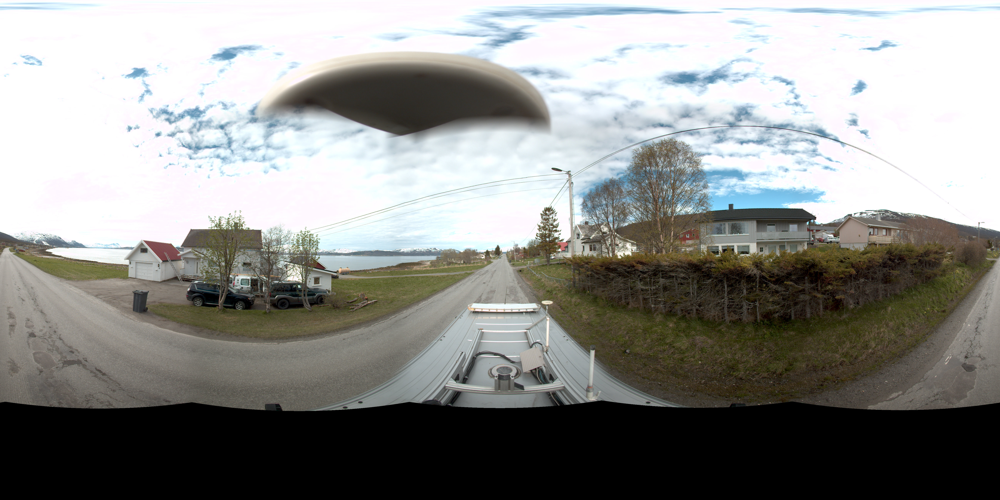

In [11]:
im

In [ ]:
We can prepare the image of the model using DetrFeatureExtractor. It will take care of the resizing of the image +normalization 
across the channels using the ImageNet mean and standard deviation.

In [6]:
from transformers import DetrFeatureExtractor

feature_extractor = DetrFeatureExtractor.from_pretrained("facebook/detr-resnet-50-panoptic")

encoding = feature_extractor(im, return_tensors="pt")
encoding.keys()

Downloading:   0%|          | 0.00/273 [00:00<?, ?B/s]

dict_keys(['pixel_values', 'pixel_mask'])

In [7]:
encoding['pixel_values'].shape

torch.Size([1, 3, 666, 1332])

## Forward Pass

Next, lets run the pixel_values through the model

In [14]:
feature_extractor = DetrFeatureExtractor.from_pretrained('facebook/detr-resnet-101-panoptic')
model = DetrForSegmentation.from_pretrained('facebook/detr-resnet-101-panoptic')


Downloading:   0%|          | 0.00/273 [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/11.3k [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/237M [00:00<?, ?B/s]

Downloading: "https://github.com/rwightman/pytorch-image-models/releases/download/v0.1-rsb-weights/resnet101_a1h-36d3f2aa.pth" to /root/.cache/torch/hub/checkpoints/resnet101_a1h-36d3f2aa.pth


In [15]:
outputs = model(**encoding)

This returns a mask for each query (DETR uses 100 queries for coco)

In [16]:
outputs.pred_masks.shape

torch.Size([1, 100, 167, 333])

In [30]:
target_sizes = torch.tensor([im.size[::-1]])
results = feature_extractor.post_process(outputs, target_sizes=target_sizes)[0]

In [31]:
for score, label, box in zip(results["scores"], results["labels"], results["boxes"]):
    box = [round(i, 2) for i in box.tolist()]
    # let's only keep detections with score > 0.9
    if score > 0.9:
        print(
            f"Detected {model.config.id2label[label.item()]} with confidence "
            f"{round(score.item(), 3)} at location {box}"
        )

Detected house with confidence 0.961 at location [3364.1, 1055.56, 4279.16, 1405.45]
Detected LABEL_197 with confidence 0.937 at location [745.61, 1029.13, 5391.8, 1466.35]
Detected road with confidence 0.997 at location [4.23, 1269.96, 5396.44, 2258.17]
Detected car with confidence 0.99 at location [2590.22, 1400.66, 2669.75, 1447.04]
Detected car with confidence 0.909 at location [4725.76, 1288.81, 4817.16, 1334.34]
Detected truck with confidence 0.937 at location [5072.34, 1296.2, 5221.6, 1400.44]
Detected LABEL_187 with confidence 0.999 at location [4.01, 0.08, 5396.13, 1346.87]
Detected car with confidence 0.984 at location [5196.04, 1332.06, 5390.84, 1429.63]
Detected LABEL_193 with confidence 0.939 at location [83.72, 1281.65, 5119.15, 2062.36]
Detected truck with confidence 0.996 at location [1793.99, 1315.95, 2401.13, 1600.48]


In [32]:
for score, label, box in zip(results["scores"], results["labels"], results["boxes"]):
    box = [round(i, 2) for i in box.tolist()]
    # let's only keep detections with score > 0.8
    if score > 0.8:
        print(
            f"Detected {model.config.id2label[label.item()]} with confidence "
            f"{round(score.item(), 3)} at location {box}"
        )

Detected house with confidence 0.961 at location [3364.1, 1055.56, 4279.16, 1405.45]
Detected LABEL_197 with confidence 0.937 at location [745.61, 1029.13, 5391.8, 1466.35]
Detected car with confidence 0.829 at location [4811.84, 1279.45, 4939.12, 1333.92]
Detected road with confidence 0.997 at location [4.23, 1269.96, 5396.44, 2258.17]
Detected LABEL_184 with confidence 0.866 at location [1770.85, 820.66, 5050.65, 1441.02]
Detected car with confidence 0.889 at location [2812.73, 1332.42, 2946.85, 1371.69]
Detected LABEL_199 with confidence 0.821 at location [12.81, 1465.11, 3553.11, 2253.44]
Detected car with confidence 0.804 at location [2738.4, 1374.69, 2801.2, 1405.67]
Detected car with confidence 0.99 at location [2590.22, 1400.66, 2669.75, 1447.04]
Detected LABEL_185 with confidence 0.809 at location [3142.14, 1329.9, 4252.83, 1568.25]
Detected car with confidence 0.909 at location [4725.76, 1288.81, 4817.16, 1334.34]
Detected truck with confidence 0.937 at location [5072.34, 129

In [17]:
#let us visualize the high confidence ones:

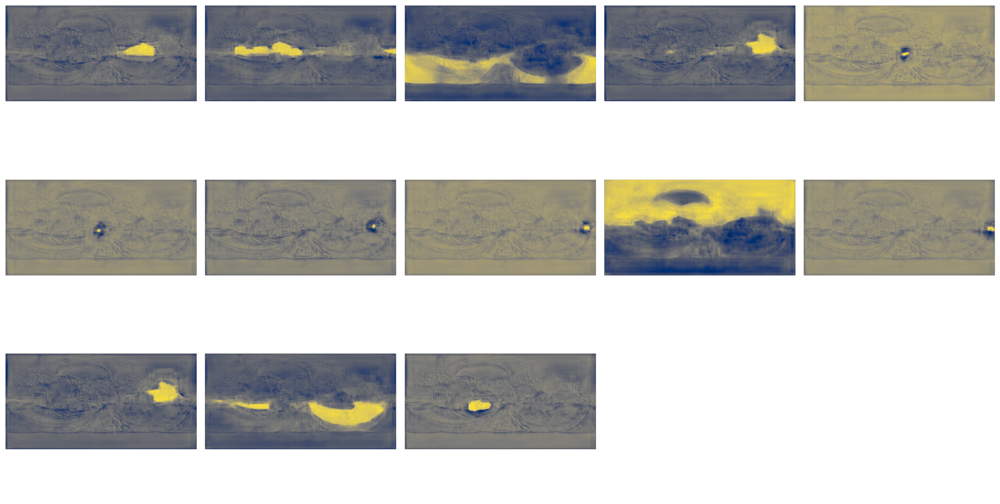

In [18]:
import matplotlib.pyplot as plt
%config InlineBackend.figure_format = 'retina'
import math

# compute the scores, excluding the "no-object" class (the last one)
scores = outputs.logits.softmax(-1)[..., :-1].max(-1)[0]
# threshold the confidence
keep = scores > 0.85

# Plot all the remaining masks
ncols = 5
fig, axs = plt.subplots(ncols=ncols, nrows=math.ceil(keep.sum().item() / ncols), figsize=(18, 10))
for line in axs:
    for a in line:
        a.axis('off')
for i, mask in enumerate(outputs.pred_masks[keep].detach().numpy()):
    ax = axs[i // ncols, i % ncols]
    ax.imshow(mask, cmap="cividis")
    ax.axis('off')
fig.tight_layout()

Finally, we can merge the masks using a pixel-wise argmax, to obtain a unified panoptic segmentation of the image. 
To do that, we can use DetrFeatureExtractor's post_process_panoptic method.

In [20]:
import torch
processed_sizes = torch.as_tensor(encoding['pixel_values'].shape[-2:]).unsqueeze(0)
result = feature_extractor.post_process_panoptic(outputs, processed_sizes)[0]

/usr/local/lib/python3.6/dist-packages/torch/nn/functional.py:3635: UserWarning: Default upsampling behavior when mode=bilinear is changed to align_corners=False since 0.4.0. Please specify align_corners=True if the old behavior is desired. See the documentation of nn.Upsample for details.
  "See the documentation of nn.Upsample for details.".format(mode)


Lets visualize the result

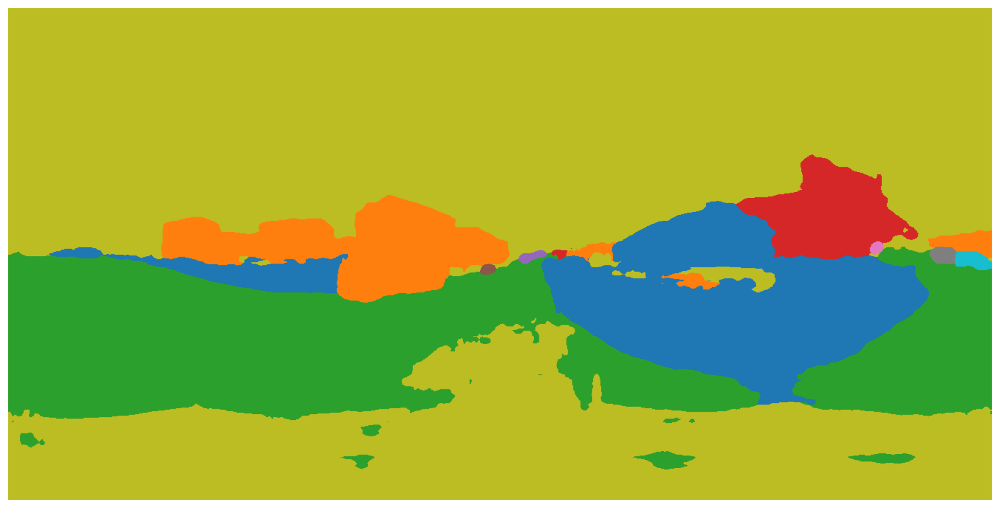

In [22]:
import itertools
import io
import seaborn as sns
import numpy 
from transformers.models.detr.feature_extraction_detr import rgb_to_id, id_to_rgb

palette = itertools.cycle(sns.color_palette())

# The segmentation is stored in a special-format png
panoptic_seg = Image.open(io.BytesIO(result['png_string']))
panoptic_seg = numpy.array(panoptic_seg, dtype=numpy.uint8).copy()
# We retrieve the ids corresponding to each mask
panoptic_seg_id = rgb_to_id(panoptic_seg)

# Finally we color each mask individually
panoptic_seg[:, :, :] = 0
for id in range(panoptic_seg_id.max() + 1):
  panoptic_seg[panoptic_seg_id == id] = numpy.asarray(next(palette)) * 255
plt.figure(figsize=(15,15))
plt.imshow(panoptic_seg)
plt.axis('off')
plt.show()

### Panoptic Visualization using Detectron2

In [23]:
%cd detectron2

/storage/Projects/notebooks/detectron2


In [24]:
!pip install --upgrade pyyaml

/usr/lib/python3/dist-packages/secretstorage/dhcrypto.py:15: CryptographyDeprecationWarning: int_from_bytes is deprecated, use int.from_bytes instead
  from cryptography.utils import int_from_bytes
/usr/lib/python3/dist-packages/secretstorage/util.py:19: CryptographyDeprecationWarning: int_from_bytes is deprecated, use int.from_bytes instead
  from cryptography.utils import int_from_bytes


In [25]:
from detectron2.config import get_cfg
from detectron2.utils.visualizer import Visualizer
from detectron2.data import MetadataCatalog

In [26]:
def cv2_imshow(img):
    img = img[:,:,[2,1,0]]
    img = Image.fromarray(img)
    plt.figure(figsize=(20, 20))
    plt.imshow(img)
    plt.axis('off')
    plt.show()

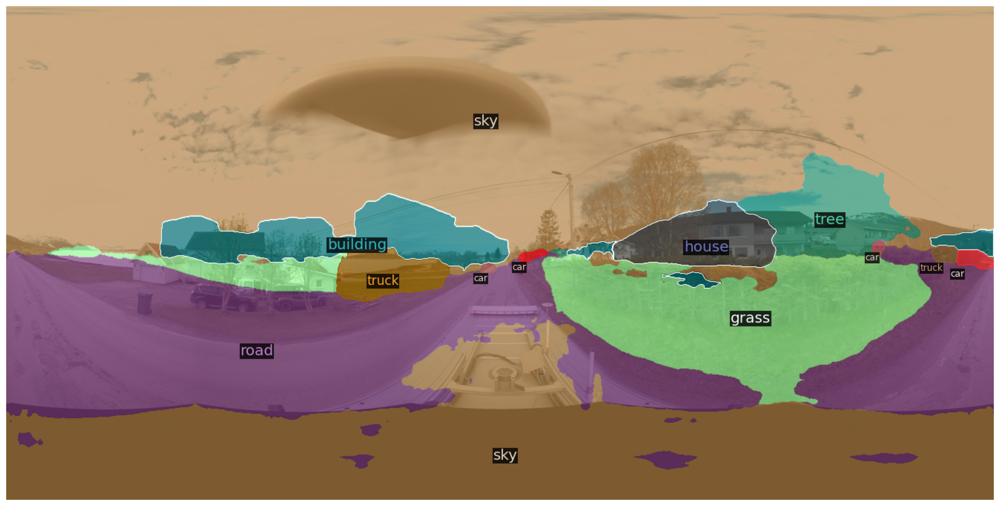

In [28]:
from copy import deepcopy

# We extract the segments info and the panoptic result from DETR's prediction
segments_info = deepcopy(result["segments_info"])
# Panoptic predictions are stored in a special format png
panoptic_seg = Image.open(io.BytesIO(result['png_string']))
final_w, final_h = panoptic_seg.size
# We convert the png into an segment id map
panoptic_seg = numpy.array(panoptic_seg, dtype=numpy.uint8)
panoptic_seg = torch.from_numpy(rgb_to_id(panoptic_seg))
    
# Detectron2 uses a different numbering of coco classes, here we convert the class ids accordingly
meta = MetadataCatalog.get("coco_2017_val_panoptic_separated")
for i in range(len(segments_info)):
    c = segments_info[i]["category_id"]
    segments_info[i]["category_id"] = meta.thing_dataset_id_to_contiguous_id[c] if segments_info[i]["isthing"] else meta.stuff_dataset_id_to_contiguous_id[c]

# Finally we visualize the prediction
v = Visualizer(numpy.array(im.copy().resize((final_w, final_h)))[:, :, ::-1], meta, scale=1.0)
v._default_font_size = 20
v = v.draw_panoptic_seg_predictions(panoptic_seg, segments_info, area_threshold=0)
cv2_imshow(v.get_image())